<h1> Steps to run this on your laptops </h1>

You can follow the steps below or run based on the README.md on github https://github.com/ryderling/DEEPSEC

1. Requirements
<br> a. Pytorch
<br> b. numpy, scipy, PIL, skimage, tqdm
> pip3 install torch torchvision



2. Download as zip or fork to your own repo from DEEPSEC https://github.com/ryderling/DEEPSEC
3. cd to your Downloads/DEEPSEC-master/RawModels folder and run the model
> cd Downloads/DEEPSEC-master/RawModels
> python3 train_mnist.py


<h2> Training the Model </h2>
This process will take approximately 30-1.5 hours. The results are taken from running on my cpu.

<strong> The model is able to correctly classify 97.27% of the handwritten images from the MNIST data set.  </strong>

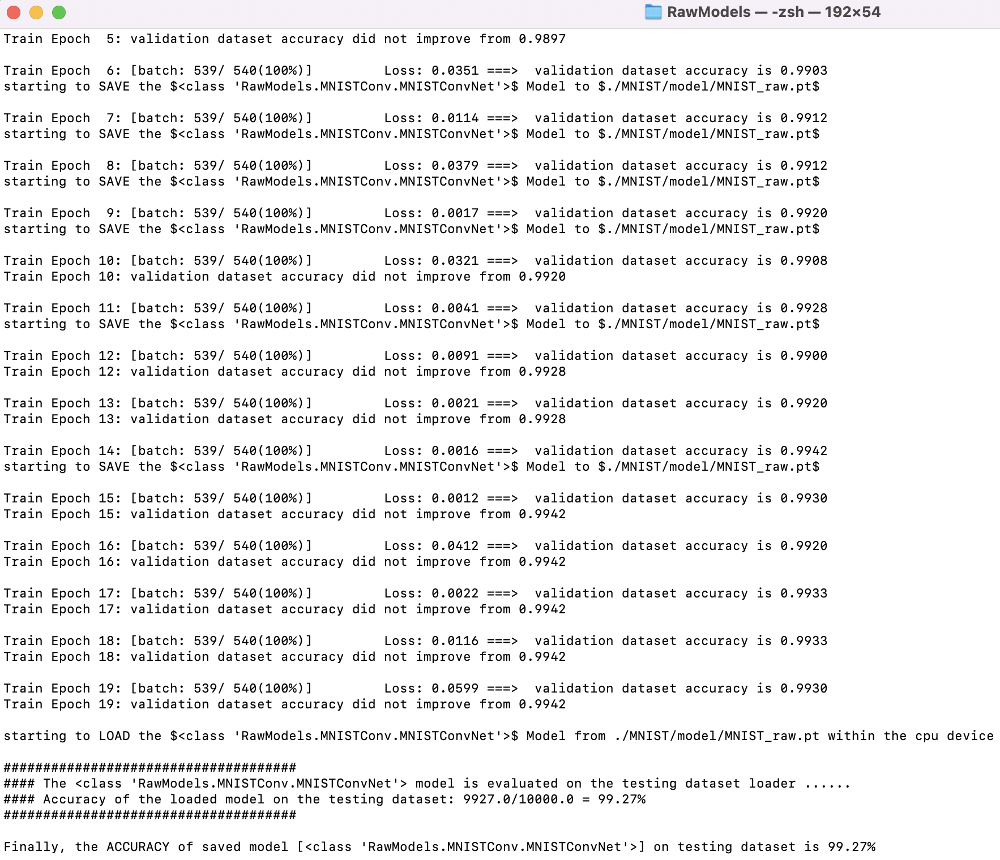

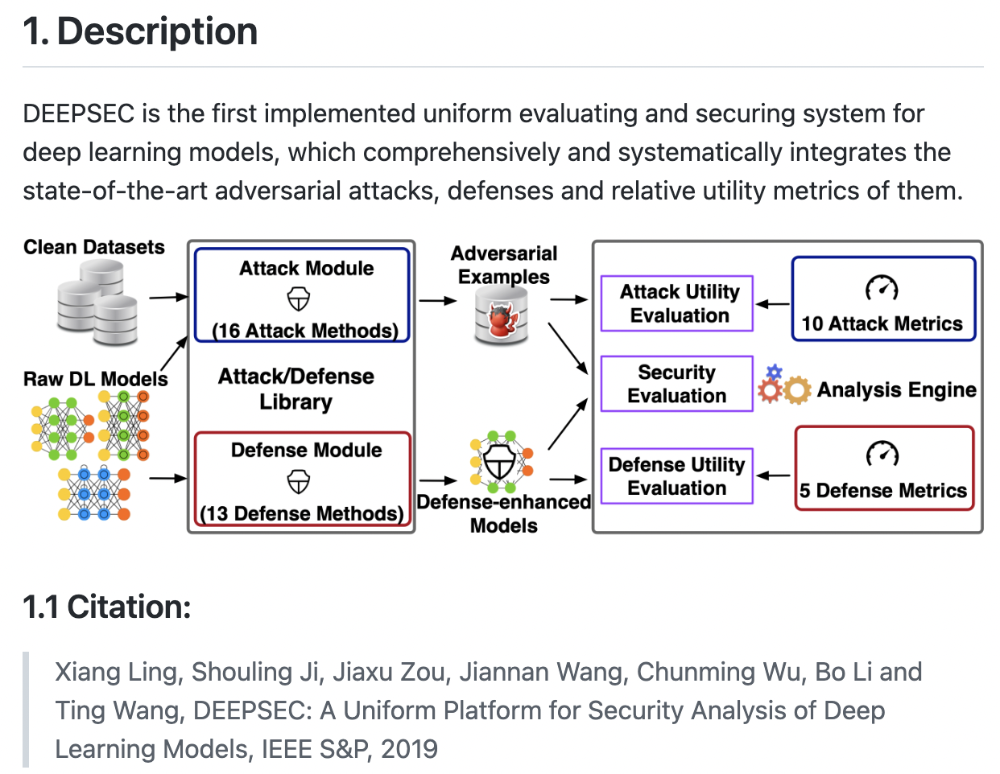

<h1> Main Idea - Evaluating White-box Attacks and Possible Defenses</h1>

<h3> 1. We will mainly train the Model to read the handwritten numbers from the MNIST Dataset </h3>

<h3> 2. Here, we randomly select clean samples that are correctly predicted by the corresponding model from the testing set of each dataset (i.e., MNIST and CIFAR10). In addition, for target attacks, the target class is chosen randomly among the labels except the ground truth class. Then, these selected clean samples will be attacked by all kinds of adversarial attacks. </h3>

> change directory into CleanDatasets <br>
> python3 CandidatesSelection.py --dataset=MNIST --number=1000

<h3> 3. We will choose the <strong>FGSM Attack</strong> which we have discussed previously. </h3> 

> python FGSM_Generation.py --dataset=MNIST --epsilon=0.3

<strong>EXTRA: The following are other white-box attacks (not covered by us) which are built on from FGSM to be more efficient and effective. </strong>

<strong>BIM Attack</strong>
<br>\'BIM attack method was proposed by kurakin et al. [18] in 2016. BIM method is an improvement result of FGSM. The method is to modify the pixel value one step at a time by iteration and prune the generated pixel value to ensure that it is within the given range of the original image.\'
<br><strong>Cited from:</strong> https://arxiv.org/pdf/2010.11143.pdf

<strong>C&W Attack</strong>
<br>\'Defensive distillation methods are used to protect algorithms from attacks, which reduce the success rate from 95% to less than 1%. C&W Attack is an advanced attack that produces much smaller changes which bypass defensive distillation.\'
<br><strong>Cited from:</strong> https://www.sciencedirect.com/science/article/pii/S209580991930503X

<strong>Deepfool Attack</strong>
<br>\'The DeepFool attack approximates the decision boundary close to a targeted instance (triangle) by a linear line and searches for the shortest distance to cross the boundary and achieve targeted misclassification. In FGSM, perturbations are big while C&W attack is slow. Deepfool creates faster solutions with smaller perturbations.\'
<br><strong>Cited from:</strong> https://www.researchgate.net/figure/DeepFool-The-DeepFool-attack-approximates-the-decision-boundary-close-to-a-targeted_fig2_357785455

<strong>PGD Attack</strong>
<br>\'PGD attack aims to have the closest similarity to another class, with minimum perturbation for a source input. The inner maximization provlem aims to find an adverserial version of a given data point x that achieves a high loss. The goal of the outer minimization problem is to find model parameters so that the "adverserial loss" given by the inner attack problem is minimized. PGD is a variation of the BIM method.\'
<br><strong>Cited from:</strong> https://files.sri.inf.ethz.ch/website/teaching/riai2020/materials/lectures/LECTURE3_ATTACKS.pdf
 
<h3> 4. Generate Adverserial Examples using FGSM and observe the effect of epsilon values on the examples </h3>

<strong> Epsilon is a small number controlling the size of adversarial attack, which needs to be chosen in order to be effective but not to be too obvious.</strong>

> Change directory into Attacks folder <br>
> python3 FGSM_Generation.py --dataset=MNIST --epsilon=0.3 <br>
> python3 FGSM_Generation.py --dataset=MNIST --epsilon=0.1 <br>
> python3 FGSM_Generation.py --dataset=MNIST --epsilon=0.01 <br>

<br> The results of 0.3 epsilon: misclassification ratio = 79.6%
<br> The results of 0.1 epsilon: misclassification ratio = 9.5%
<br> The results of 0.01 epsilon: misclassification ratio = 0.3%

<strong>With the increase of epsilon, we can foresee the decision boundary cannot work out and the misclassification ratio increases.</strong>


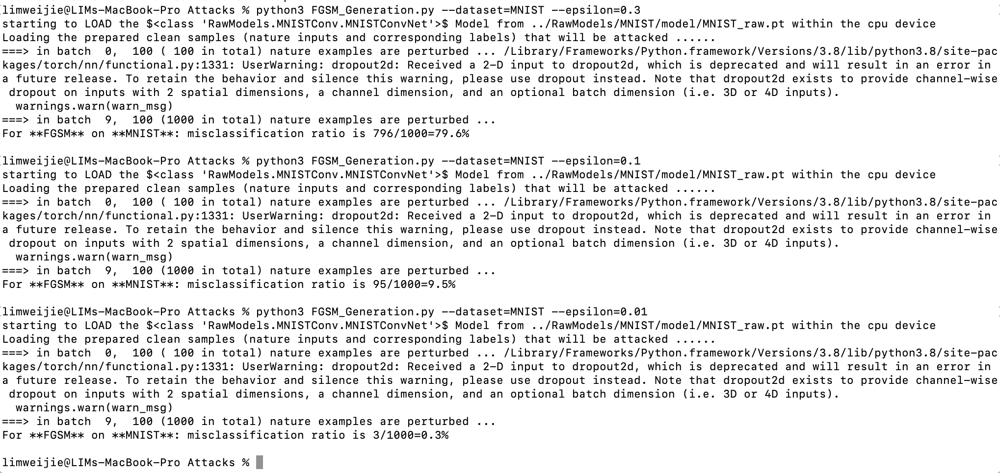


<h3> 5. Toggle with other Attacks </h3>

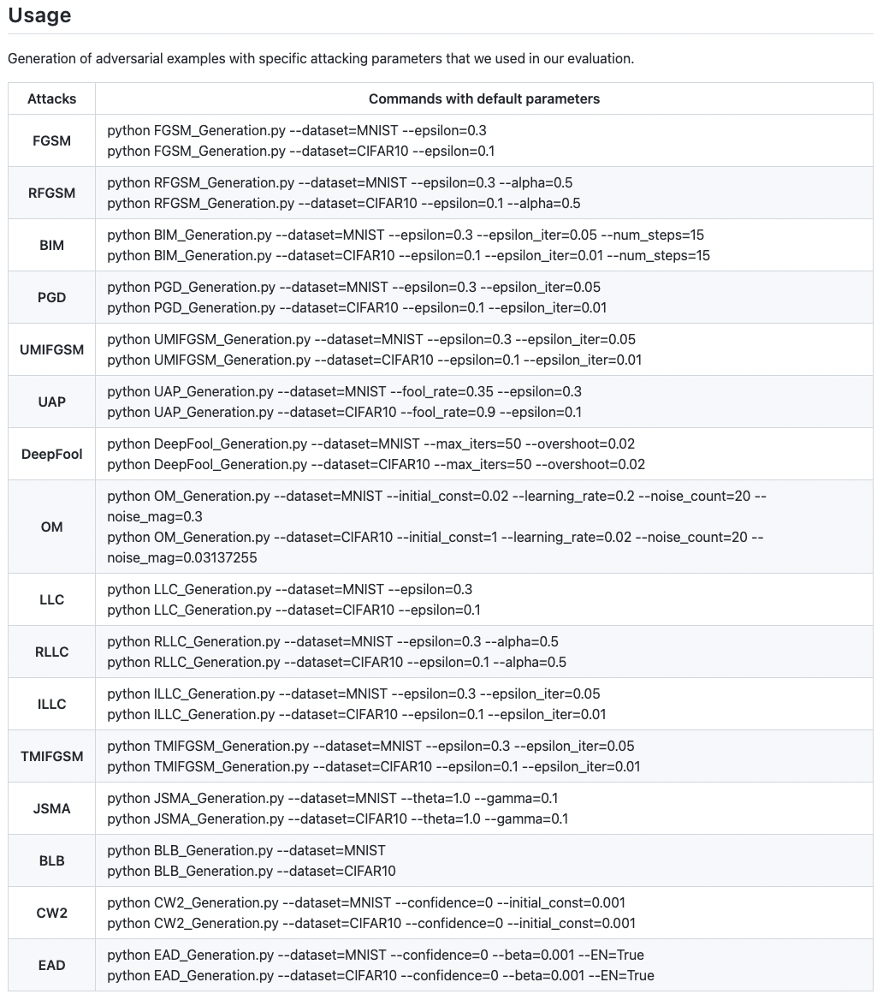
Credits: https://github.com/ryderling/DEEPSEC/tree/master/Attacks




<h1> Evaluate Attacks </h1>

> Change Directory into Evaluations folder <br>
> python3 AttackEvaluations.py --dataset=MNIST --attack=FGSM <br>

Other Metrics are used, but for simplicity, we will look at misclassification ratio. 

<h3> In machine learning, misclassification rate is a metric that tells us the percentage of observations that were incorrectly predicted. </h3>

Misclassification Rate = # incorrect predictions / # total predictions

The value for misclassification rate can range from 0 to 1 where:

0 represents a model that had zero incorrect predictions.
1 represents a model that had completely incorrect predictions.
The lower the value for the misclassification rate, the better a classification model is able to predict the outcomes of the response variable.

<br> The results of 0.3 epsilon: misclassification ratio = 79.6%
<br> The results of 0.1 epsilon: misclassification ratio = 9.5%
<br> The results of 0.01 epsilon: misclassification ratio = 0.3%

<h1> Defenses Against FGSM Attacks </h1>

<h2> Model 1. Training Models specifically on adverserial examples to improve robustness </h2>

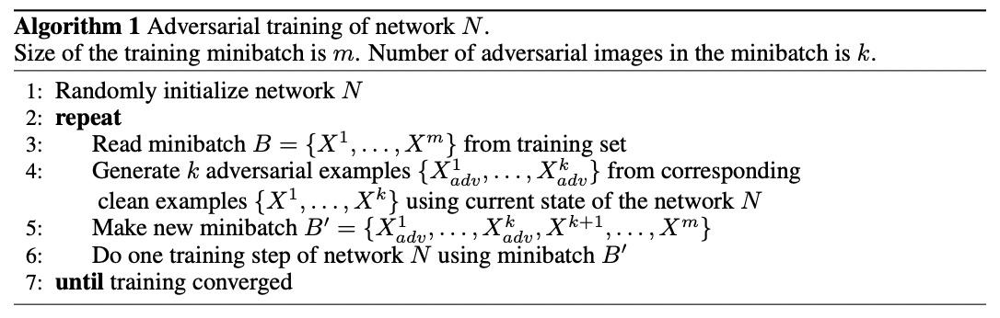

<h4> The basic idea of adversarial training is to:</h4>

    - inject adversarial examples into the training set, continually generating new adversarial examples at every step of training (Goodfellow et al., 2014).
    - Adversarial training was originally developed for small models that did not use batch normalization. To scale adversarial training to ImageNet, we recommend using batch normalization (Ioffe & Szegedy, 2015). 
    - To do so successfully, we found that it was important for examples to be grouped into batches containing both normal and adversarial examples before taking each training step, as described in algorithm. 
    
    
<h3> Control of No. of adverserial examples using loss function </h3>

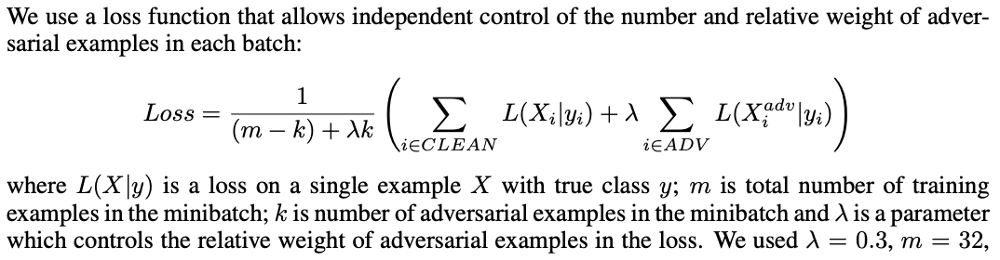

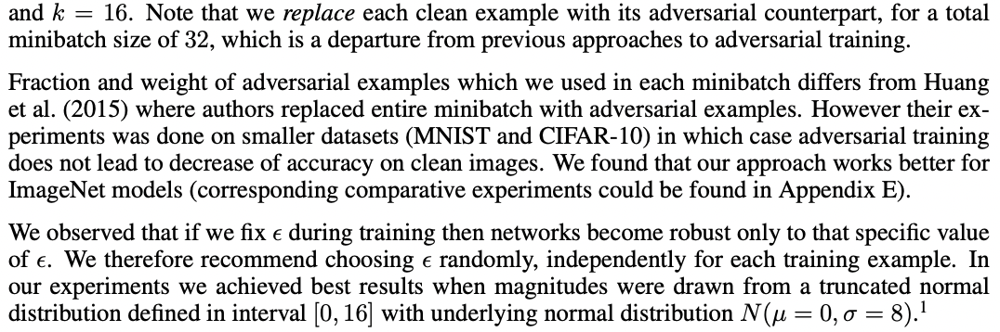

Credit: https://arxiv.org/pdf/1611.01236.pdf

The following defense takes approximately 30mins to 1 hour to run.

> Change directory into Defenses folder <br>
> python3 NAT_Test.py --dataset=MNIST --adv_ratio=0.3 --clip_max=0.3 --eps_mu=0 --eps_sigma=50 <br>

<h3> Results of NAT Test </h3>

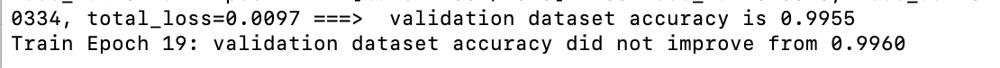

Althought the model decreased in accuracy after training on adverserial samples from 0.9960 to 0.9955, it still performs better than when not being trained on adverserial samples.


<h2> Model 2. Training Models on adverserial examples - <u> Ensemble Adverserial Training</u> </h2>

Adversarial examples are perturbed inputs designed to fool machine learning models. Adversarial training injects such examples into training data to increase robustness. To scale this technique to large datasets, perturbations are crafted using fast single-step methods that maximize a linear approximation of the model's loss. We show that this form of adversarial training converges to a degenerate global minimum, wherein small curvature artifacts near the data points obfuscate a linear approximation of the loss.

<h4> The model thus learns to generate weak perturbations, rather than defend against strong ones. As a result, we find that adversarial training remains vulnerable to black-box attacks, where we transfer perturbations computed on undefended models, as well as to a powerful novel single-step attack that escapes the non-smooth vicinity of the input data via a small random step. </h4>

<h4> Therefore, Ensemble Adversarial Training, a technique that augments training data with perturbations transferred from other models. </h4>

On ImageNet, Ensemble Adversarial Training yields models with strong robustness to black-box attacks. In particular, our most robust model won the first round of the NIPS 2017 competition on Defenses against Adversarial Attacks. 

However, subsequent work found that more elaborate black-box attacks could significantly enhance transferability and reduce the accuracy of our models.

Credit: https://arxiv.org/abs/1705.07204 & https://arxiv.org/pdf/1705.07204.pdf 

The following defense takes approximately 5 to 6 hours to run.

> Change directory into Defenses folder <br>
> python3 EAT_Test.py --dataset=MNIST --train_externals=True --eps=0.3 --alpha=0.05 <br>

<h3> Results of Ensemble Adverserial Training (EAT) </h3>

We can see that the accuracy also decreased from 0.9957 to 0.9945, but still keeping the model robust. 

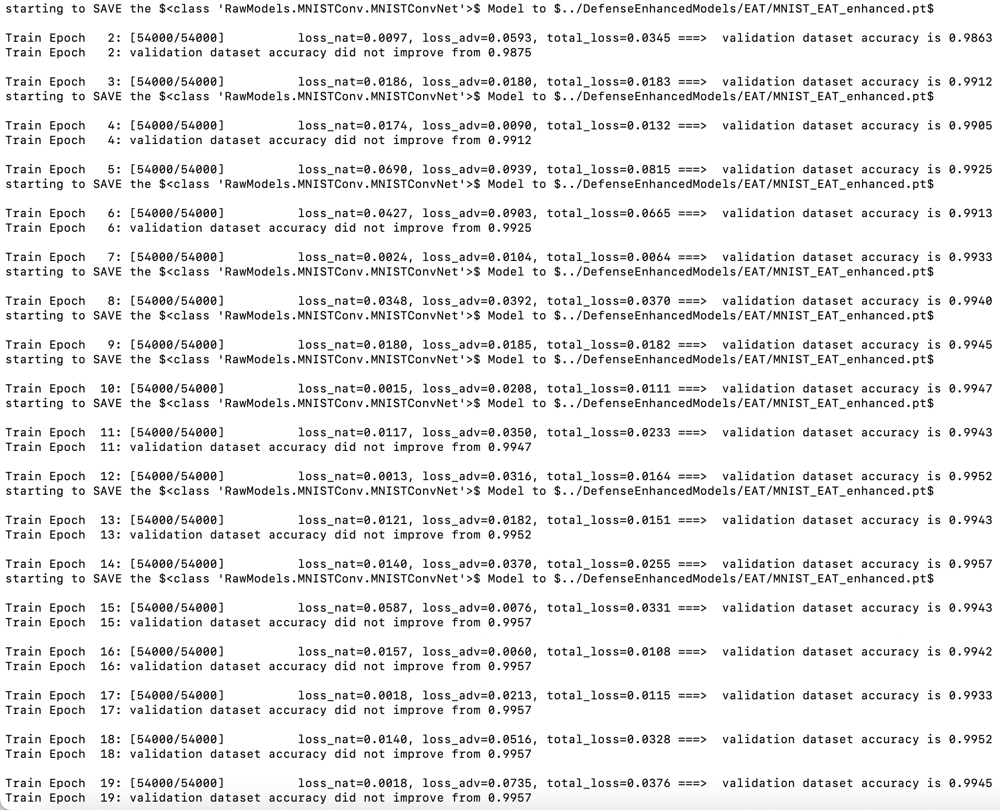

<h1> Evaluate Defenses of NAT and EAT of the 2 defenses above </h1>

The following metrics are used:

<h3> Metric 1: Classification accuracy of defense-enhanced model </h3>
correct_prediction_def = np.equal(predicted_defended, true_label) <br>
def_acc = np.mean(correct_prediction_def.astype(float))

<h3> Metric 2: Classification accuracy of raw model </h3>
correct_prediction_raw = np.equal(np.argmax(predicted_raw, axis=1), true_label) <br>
raw_acc = np.mean(correct_prediction_raw.astype(float))

<h3> Metric 3: Classification Accuracy Variance(CAV) </h3>
CAV is better when it's more positive and it's worse when it's negative.

Shows the difference between CRR and CSR - responsible for the metrics responsible for prediction of non-adverserial examples which are misclassified by the model before or after.

> cav = def_acc - raw_acc

<h3> Metric 4: Classification Rectify Ratio(CRR) & Classification Sacrifice Ratio(CSR) </h3>
CRR is a percentage of testing examples that are misclassified by the initial model, but correctly classified by secure model. 

CSR is the percentage of testing examples that are correctly classified by the initial model, but misclassified by the secure model.


crr = (len(idx_def) - len(idx)) / len(predicted_raw) <br>
csr = (len(idx_raw) - len(idx)) / len(predicted_raw) <br>

<h3> Metric 5: Classification Confidence Variance (CCV) & Classification Output Stability (COS) </h3>
Responsible for similarity of responses to correctly classified examples. The more similar our models, the less is CCV and COS values. 0 means that the protected model has the same reaction to none of the cellular examples as an initial model, which is good.
    

> Change Directory into Evaluations folder <br>
> python3 DefenseEvaluations.py --dataset=MNIST --defense=NAT <br>
> python3 DefenseEvaluations.py --dataset=MNIST --defense=EAT <br>


<h2> Defense Model 1 - NAT / Adverserial Training at Scale </h2>

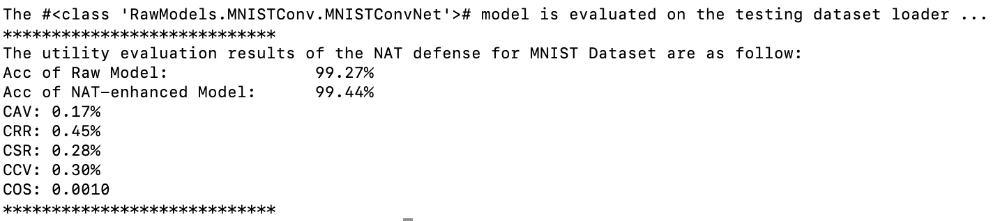


<h2> Defense Model 2 - EAT / Ensemble Adverserial Training </h2>

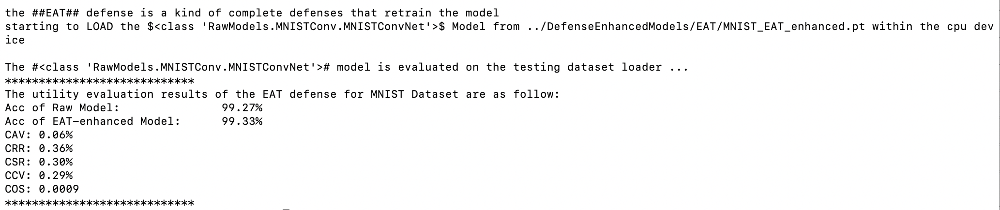

We can see that for both NAT and EAT, the Accuracy of the protected model is higher than the raw model. 

The CAV is higher in NAT at 0.17% than EAT which is at 0.06%, but both are better at predicting non-adverserial examples which were misclassified before.

COS is closer to zero but its CCV could be improved.

<h3> Other Models can be used: </h3>

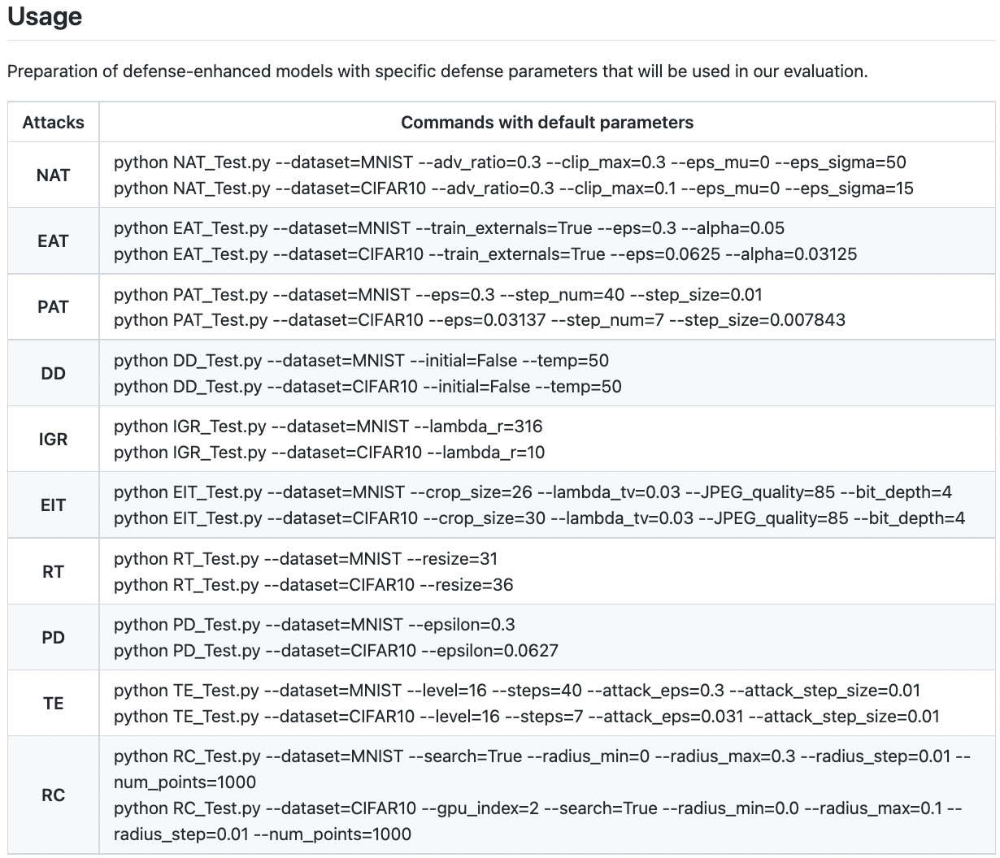

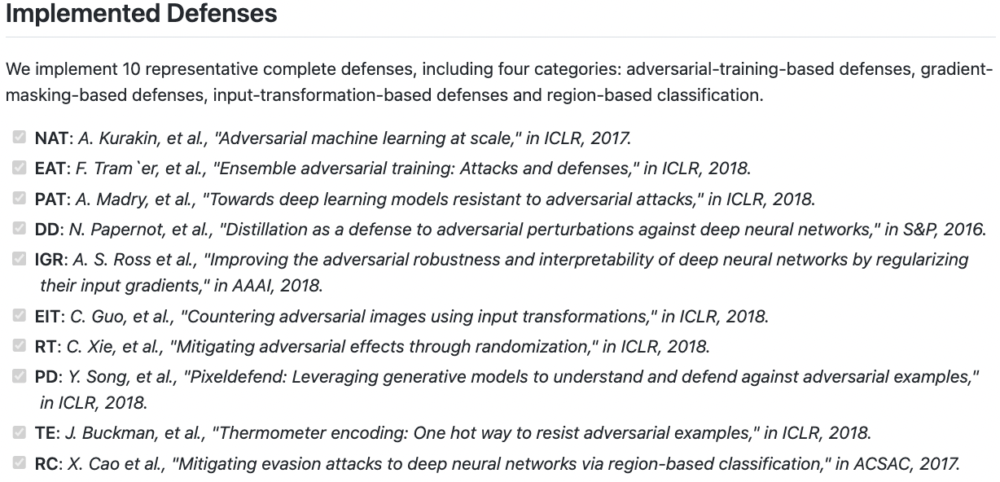

Credits:https://github.com/ryderling/DEEPSEC/tree/master/Defenses